In [3]:
import os
import sys
sys.path = ['/nfs/gns/homes/willj/anaconda3/envs/GTEx/lib/python3.5/site-packages'] + sys.path
GTEx_directory = '/hps/nobackup/research/stegle/users/willj/GTEx'
import openslide
from openslide.deepzoom import DeepZoomGenerator
from openslide import open_slide
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import scipy

lung_filepath = os.path.join(GTEx_directory,'data','raw','Lung')
lung_images = os.listdir(lung_filepath)
lung_IDs = [x.split('.')[0] for x in lung_images]


# Problem

There is a problem with my sampling method. I am sampling small square patches from extremely large histopathology images which display slices of human tissue. For example, I have images of lungs, hearts and livers. However, much of the image does not display the tissue - it is a bright white 'background'. I would like to sample as many patches as I can that cover a slice of tissue, in some way.

# Lung slides

Here I display a selection of lung slides. Notice the large visual heterogeneity present between these images. Some slides are extremely porous, some are fleshy. Some are a bright red colour, and others are extremely pale.

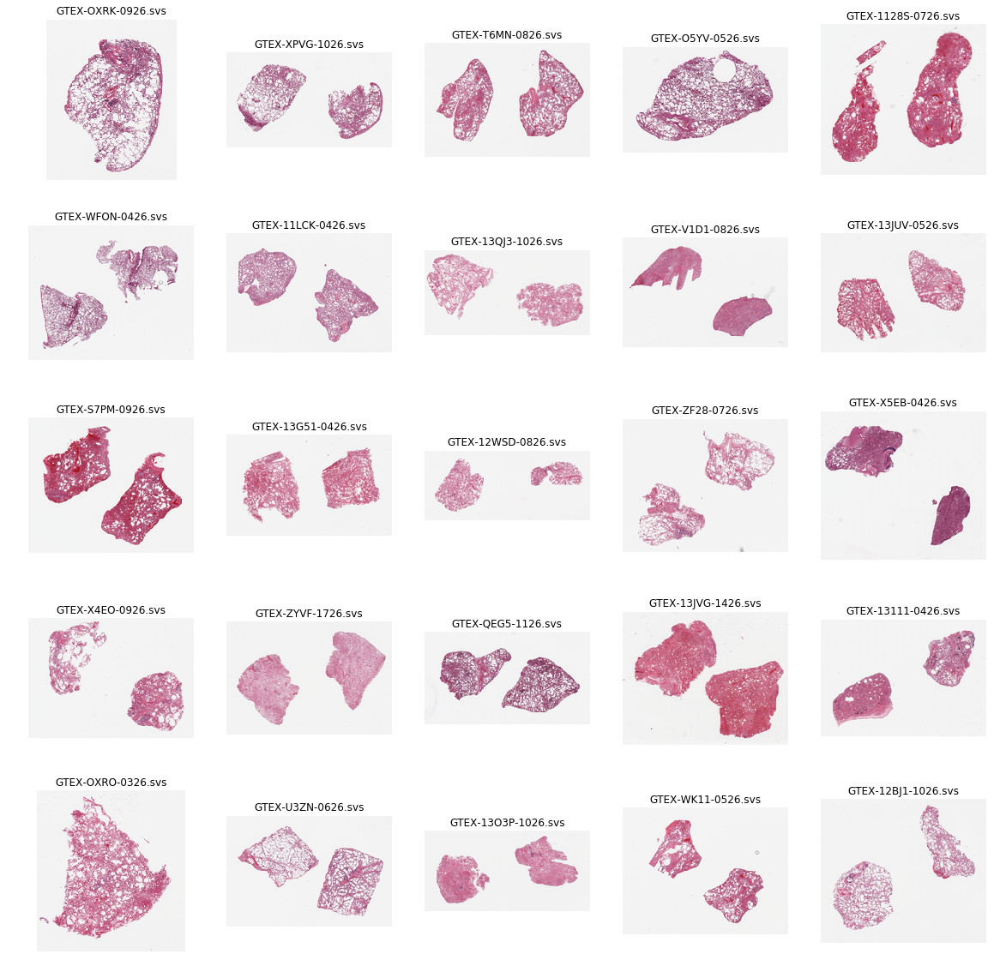

In [13]:
f, a = plt.subplots(5,5,figsize=(20,20))
lung_filepath = os.path.join(GTEx_directory,'data','raw','Lung')
lung_images = os.listdir(lung_filepath)
random_lung_images = np.random.choice(lung_images,25)
for (i,image) in enumerate(lung_images[0:25]):
    image_filepath = os.path.join(lung_filepath, image)
    image_slide = open_slide(image_filepath)
    image_thumbnail = 256 - np.array(image_slide.get_thumbnail(size=(200,300))).astype(float)
    axis = a.flatten()[i]
    axis.imshow(image_thumbnail)
    axis.axis('off')
    axis.set_title(image)  
    

# Tissue segmentation

Imagine these images, overlayed on a square-grid. An example is displayed below. We want to take all the square which overlap with a piece of tissue. How do we do this?

'GTEX-1128S-0726.svs'

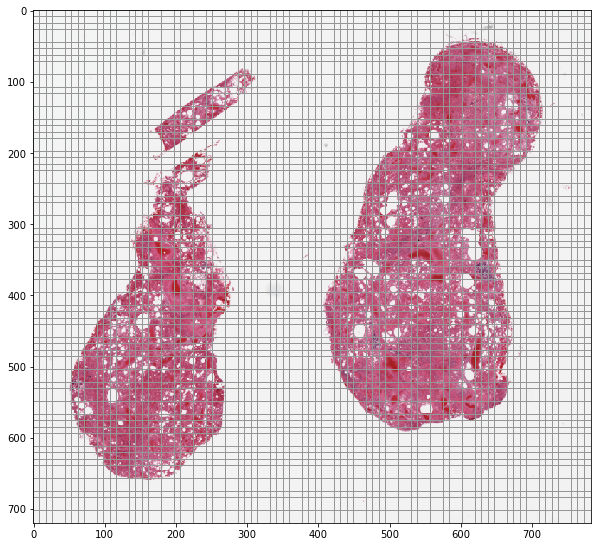

In [236]:
import cv2
from scipy.misc import imresize

# 
image_filepath = os.path.join(GTEx_directory,'data','raw','Lung', 'GTEX-OXRK-0926.svs')

image_slide = open_slide(image_filepath)
# cv2.line(image_slide, (0,128), (200,128),color=[255,255,255], thickness=1)
image_thumbnail = 256 - np.array(image_slide.get_thumbnail(size=(200,300))).astype(float)
toplevel = image_slide.level_count - 1
topdim = image_slide.level_dimensions[-1]
topdownsample = int(np.floor(image_slide.level_downsamples[-1]))

toplevelslide = image_slide.read_region((0,0), toplevel, topdim)
toplevelslide = 266 - np.array(toplevelslide)
toplevelslide = toplevelslide[:,:,0:3]
slide = toplevelslide
resizepercentage = 30
resizedslide = 255 - imresize(toplevelslide, resizepercentage)


gridsize = 512
resizedim = resizedslide.shape[0:2]
downsamplegridsize = int((gridsize *  resizepercentage) / (topdownsample * 100))
plt.figure(figsize=(10,10))
for i in range(int(resizedim[0] / downsamplegridsize)):
    resizedslide[downsamplegridsize*i,:,:] = 150
for j in range(int(resizedim[1] / downsamplegridsize)):
    resizedslide[:,downsamplegridsize*j,:] = 150

plt.imshow(resizedslide)

# Otsu threasholding

We can use a method called Otsu thresholding to roughly segment the tissue region in an image. The result of this is displayed below.

In [ ]:
lung_images[4]

In [361]:
image_slide.level_downsamples[-1]

(1.0, 4.000115856955279, 16.003032727984646)

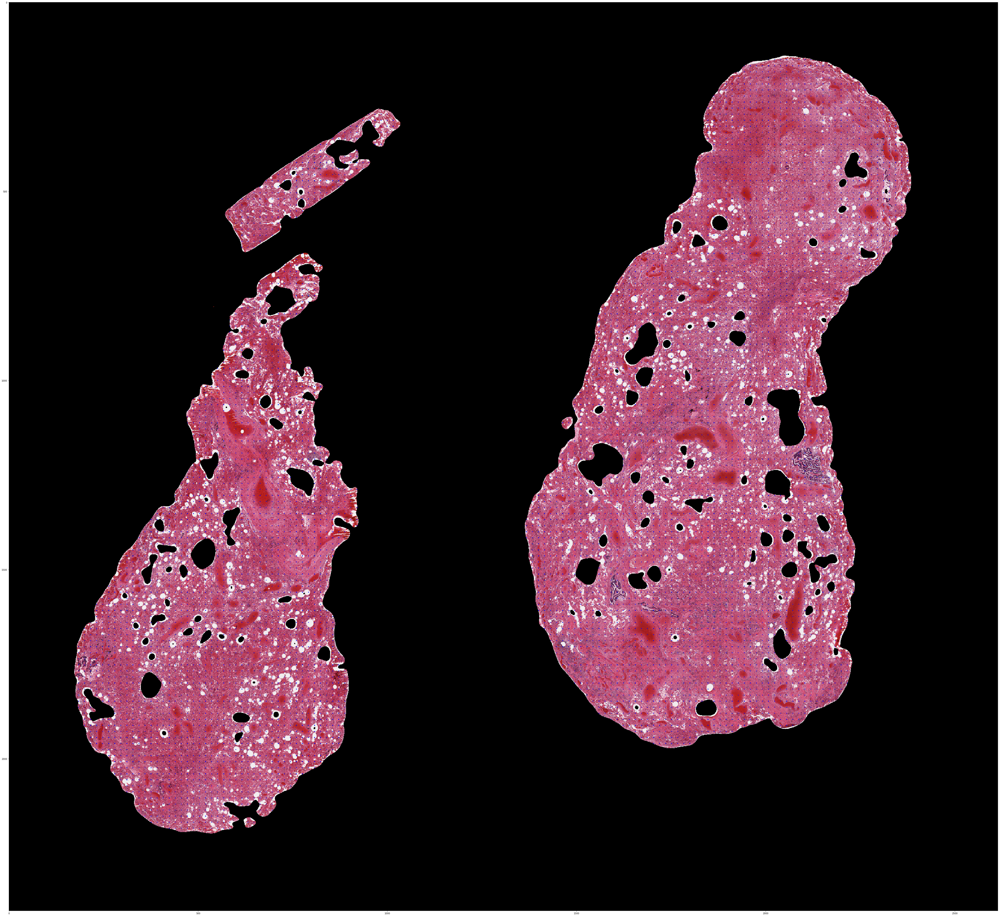

In [9]:
import cv2
from scipy.misc import imresize
import mahotas
import os
image_filepath = os.path.join(GTEx_directory,'data','raw','Lung', lung_images[4])

image_slide = open_slide(image_filepath)
# cv2.line(image_slide, (0,128), (200,128),color=[255,255,255], thickness=1)
toplevel = image_slide.level_count - 1
topdim = image_slide.level_dimensions[-1]
topdownsample = image_slide.level_downsamples[-1]
topdownsampleint = int(topdownsample)

toplevelslide = image_slide.read_region((0,0), toplevel, topdim)
toplevelslide = np.array(toplevelslide)
toplevelslide = toplevelslide[:,:,0:3]
slide = toplevelslide

blurredslide = cv2.GaussianBlur(slide, (51,51),0)
blurredslide = cv2.cvtColor(blurredslide, cv2.COLOR_BGR2GRAY)
T_otsu = mahotas.otsu(blurredslide)

mask = np.zeros_like(slide)
mask = mask[:,:,0]
mask[blurredslide < T_otsu] = 255

# plt.imshow(cv2.bitwise_and(slide, slide, mask=mask))

patchsize = 256
downsampledpatchsize = patchsize / topdownsampleint
xlimit = int(topdim[1] / downsampledpatchsize)
ylimit = int(topdim[0] / downsampledpatchsize)


# Find downsampled coords
coords = []
for i in range(xlimit):
    for j in range(ylimit):
        x = int(downsampledpatchsize/2 + i*downsampledpatchsize)
        y = int(downsampledpatchsize/2 + j*downsampledpatchsize)
        coords.append((x,y))

# Find coords in downsampled mask
mask_coords = []
for c in coords:
    x = c[0]
    y = c[1]
    if mask[x,y] > 0:
        mask_coords.append(c)
        
slidemarkings = slide.copy()
for c in mask_coords:
    x = c[0]
    y = c[1]
    slidemarkings[x-1:x+1,y-1:y+1] = [0,0,255]
    
plt.figure(figsize=(80,80))
plt.imshow(cv2.bitwise_and(slidemarkings, slidemarkings, mask=mask))

In [404]:
# Convert downsampled masked coords to full masked coords
full_mask_coords = []
for c in mask_coords:
    x = c[0]
    y = c[1]
    full_x = int(topdownsample*x)
    full_y = int(topdownsample*y)
    full_mask_coords.append((full_x,full_y))

# Extract patches

Now, we want to extract the patches which are inside this boundary. Loosely, the algorithm runs as follows:
- Specify that patch size
- Enumerate all center pixels for each gridpatches across the image
- For each center pixel, decide whether or not it is in our thresholded regions
- If it is, save that patch.

However, when thresholding I am downsampling my image. Therefore, to ensure that I extract patches of the correct resolution for the full images, I need to make sure I calculate the correct patch centers.

In [405]:
from openslide.deepzoom import DeepZoomGenerator

tiles = DeepZoomGenerator(image_slide, tile_size=patchsize, overlap=0, limit_bounds=False)

covering_tiles = []
for (i,full_coord) in enumerate(full_mask_coords):
    if i % 1000 == 0:
        print (i)
    x = int(full_coord[1] / patchsize)
    y = int(full_coord[0] / patchsize)
    tile = np.array(tiles.get_tile(tiles.level_count - 1,(x,y)))
    covering_tiles.append(tile)
    

0


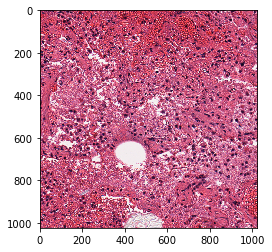

In [412]:
plt.imshow(covering_tiles[6])

In [414]:
patches.create_dataset('ID',data=covering_tiles)

<HDF5 dataset "ID": shape (432, 1024, 1024, 3), type "|u1">

In [ ]:
patches.creat

In [348]:
f = h5py.File('mytestfile.hdf5')
# lung = f.create_group('lung')
patches = f.create_group('lung/patches')
features = f.create_group('lung/features')
os.remove('mytestfile.hdf5')


In [321]:
f.create_group("lung/features/2048")


<HDF5 group "/lung/features/2048" (0 members)>

In [474]:
f = h5py.File('../../WillJdata.hdf5','w')

In [475]:
f.close()

In [470]:
g = h5py.File('../../WillJdata.hdf5','w')

OSError: Unable to create file (Unable to truncate a file which is already open)

In [432]:
x = f['lung']['patches']['128']

In [436]:
y = x['GTEX-OXRK-0926'].value